In [ ]:
# This Colab requires TF 2.5.
!pip install -U "tensorflow>=2.5"

In [ ]:
!pip install pandas

In [ ]:
import os
import pathlib

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone https://github.com/tensorflow/models

In [ ]:
%%bash
sudo apt install -y protobuf-compiler
cd /content/models/research/
protoc object_detection/protos/*.proto --python_out=.
cd /content
git clone https://github.com/cocodataset/cocoapi.git
cd /content/cocoapi/PythonAPI
make
cp -r pycocotools /content/models/research/
cd /content/models/research/
cp object_detection/packages/tf2/setup.py .
python -m pip install .
cd /content

In [9]:
import os
import pathlib
import time

import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from six.moves.urllib.request import urlopen

import tensorflow as tf
# import tensorflow_hub as hub

tf.get_logger().setLevel('ERROR')

In [10]:
import re
from shutil import copyfile
import argparse
import math
import random

In [11]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

In [ ]:
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

In [ ]:
!mkdir "/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/annotations"

In [ ]:
!cp "/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/images.tar.gz" ./

In [ ]:
!tar -xvf ./images.tar.gz

In [ ]:
!cp "/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/annotations.tar.gz" ./

In [ ]:
!tar -xvf /content/annotations.tar.gz

In [ ]:
# !tar -xvf "/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/annotations.tar.gz" 

In [8]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

In [ ]:
!pwd

In [ ]:
!python /content/models/research/object_detection/dataset_tools/create_pet_tf_record.py \
    --label_map_path=/content/models/research/object_detection/data/pet_label_map.pbtxt \
    --data_dir=`pwd` \
    --output_dir="/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/annotations/records"

In [ ]:
!pwd

In [ ]:
%cd /content

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz

In [ ]:
!tar xvfzp "/content/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz" \
-C "/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/pre-trained-models"

In [ ]:
!mkdir "/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

In [ ]:
!cp "/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/pre-trained-models/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/pipeline.config" \
"/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

In [ ]:
!cp "/content/models/research/object_detection/data/pet_label_map.pbtxt" \
"/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/annotations"

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
--model_dir="/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1" \
--pipeline_config_path="/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1/pipeline.config" 

2022-11-28 06:29:39.590101: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-28 06:29:39.590203: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-28 06:29:39.590219: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
/usr/local/lib/python3.7/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:67: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow ver

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir="/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

##이제 모델을 save해보자 

In [ ]:
!mkdir /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/exported-models/my_model

In [ ]:
!python /content/models/research/object_detection/exporter_main_v2.py \
--input_type image_tensor \
--pipeline_config_path /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1/pipeline.config\
--trained_checkpoint_dir /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1\
--output_directory /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/exported-models/my_model

##inference를 해보자.

In [12]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils


In [13]:
from object_detection.utils import ops as utils_ops

%matplotlib inline

In [29]:
PATH_TO_MODEL_DIR = '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/exported-models/my_model2'
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

In [30]:
print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 15.374510765075684 seconds


In [14]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

In [15]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

In [18]:
PATH_TO_LABELS = '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/annotations/pet_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [19]:
TEST_IMAGE_PATH = "/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/"

In [20]:
IMAGE_PATHS = [TEST_IMAGE_PATH + f for f in os.listdir('/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test')
              if re.search(r'([a-zA-Z0-9\s_\\.\-\(\):])+(?i)(.jpg|.jpeg)$', f)] 

In [21]:
print(IMAGE_PATHS )

['/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/shiba_inu_10.jpg', '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/english_cocker_spaniel_121.jpg', '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/shiba_inu_135.jpg', '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/keeshond_108.jpg', '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/great_pyrenees_126.jpg', '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/saint_bernard_157.jpg', '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/keeshond_17.jpg', '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/Ragdoll_177.jpg', '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/Main

##inference할 이미지가 너무많으면 시간이오래걸리니깐 5개의 이미지만 inference할것이다.아래는 5개의 이미지만 보겠다는 코드이다.

In [22]:
testimage = IMAGE_PATHS[0:5]

##아래에 for image_path in IMAGE_PATHS: 코드에서 IMAGE_PATHS를 test image로 바꿔야한다.

Running inference for /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/shiba_inu_10.jpg... Done
Running inference for /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/english_cocker_spaniel_121.jpg... Done
Running inference for /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/shiba_inu_135.jpg... Done
Running inference for /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/keeshond_108.jpg... Done
Running inference for /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/great_pyrenees_126.jpg... Done


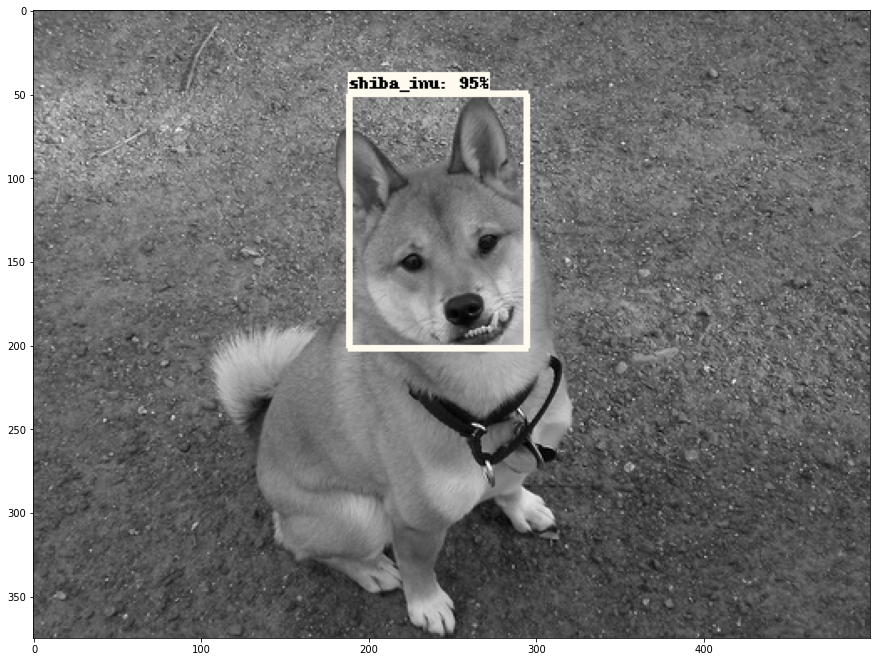

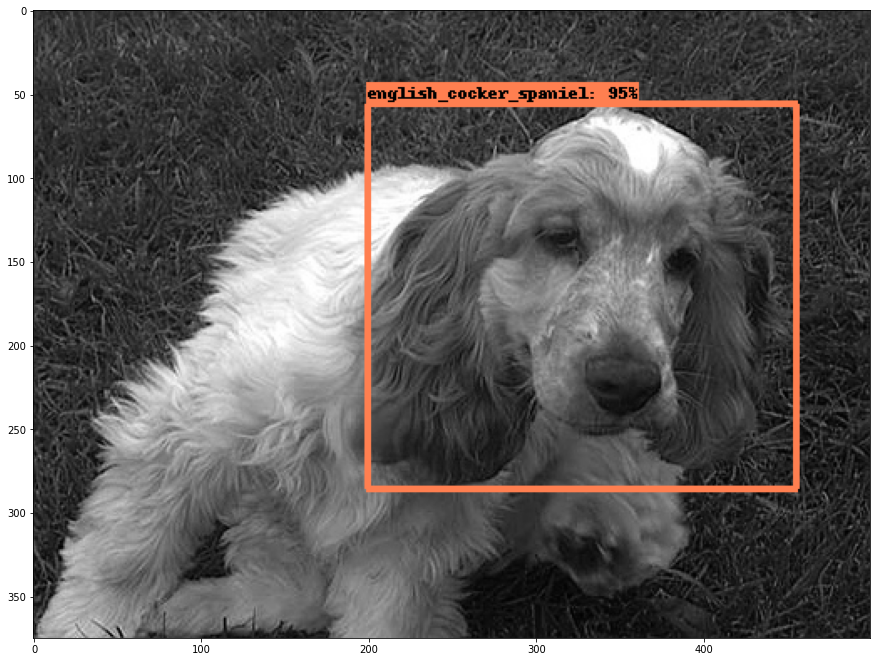

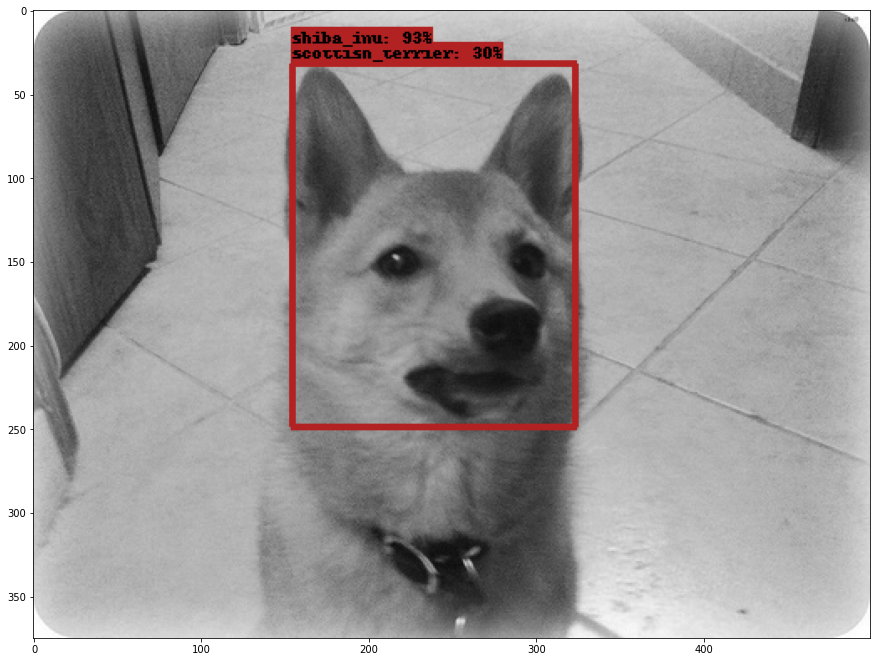

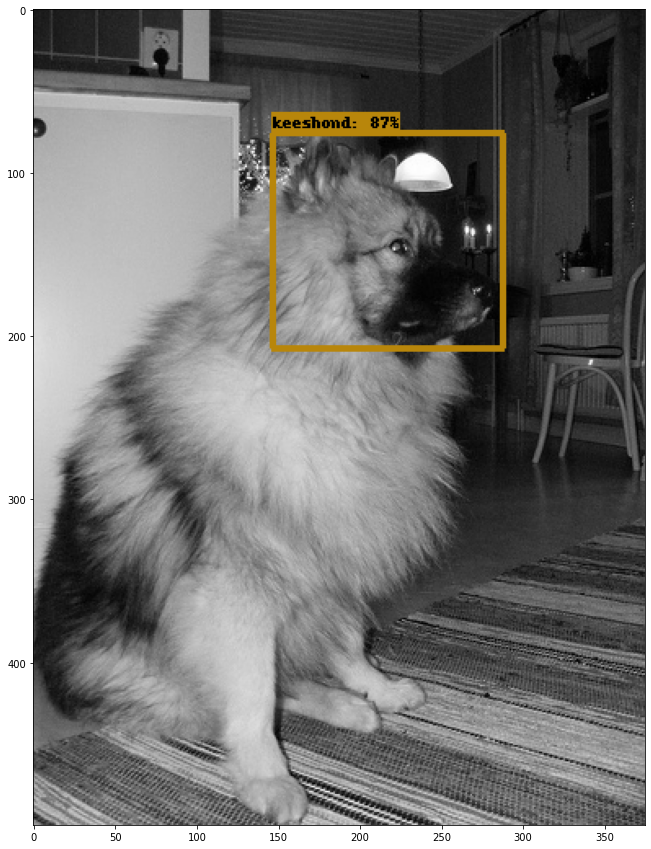

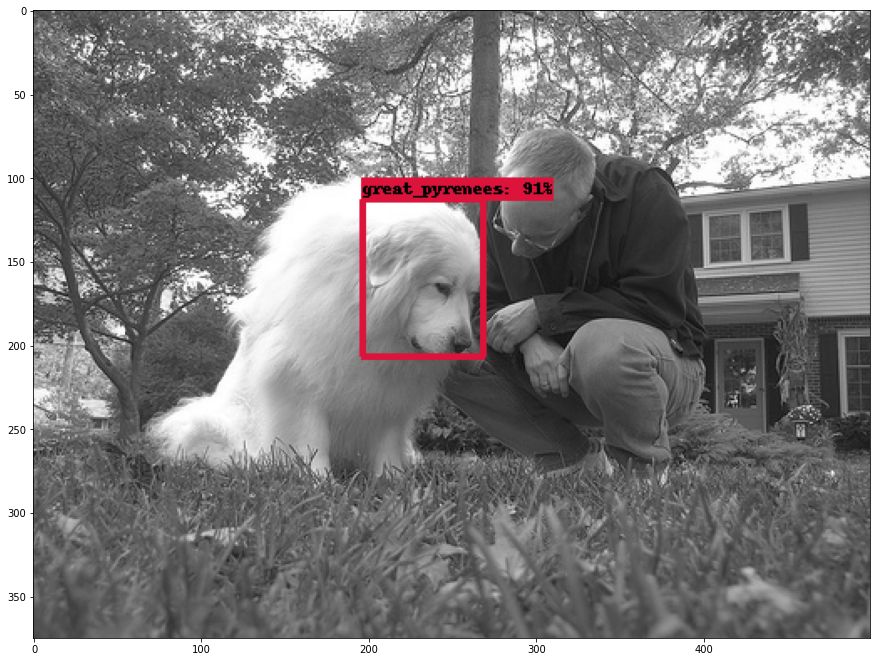

In [31]:
for image_path in testimage:

    print('Running inference for {}... '.format(image_path), end='')

    image_np = load_image_into_numpy_array(image_path)

    # Things to try:
    # Flip horizontally
    image_np = np.fliplr(image_np).copy()

    # Convert image to grayscale
    image_np = np.tile(
        np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=200,
          min_score_thresh=.30,
          agnostic_mode=False)

    plt.figure(figsize=(15,15))
    plt.imshow(image_np_with_detections)
    print('Done')
plt.show()

##이번에는 retrain즉 파인튜닝을 해볼것이다.

##myft_faster_rcnn_resnet50_v2디렉토리를 만들어서 그곳에서 파인튜닝을 할것이다. 

In [ ]:
!mkdir "/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v2"

##myft_faster_rcnn_resnet50_v1에있는 파이프라인을 파인튜닝할 모델 디렉토리에 복사한다.이때 파이프라인을 고쳐줘야한다. 체크포인트를 저번에 저장했던 my_model에 있는 체크포인트 경로로 바꿔줘야한다.

#여기서 중요한 부분은 fine tuning할때는 fine_tune_checkpoint_type을 detection으로 바꿔줘야한다.

In [ ]:
!cp "/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1/pipeline.config" \
"/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v2"

#이제 파인튜닝을 해보자

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
--model_dir="/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v2" \
--pipeline_config_path="/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v2/pipeline.config" \
--alsologtostderr

In [17]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir="/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v2"

<IPython.core.display.Javascript object>

In [ ]:
!mkdir /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/exported-models/my_model2

In [ ]:
!python /content/models/research/object_detection/exporter_main_v2.py \
--input_type image_tensor \
--pipeline_config_path /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v2/pipeline.config\
--trained_checkpoint_dir /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/models/myft_faster_rcnn_resnet50_v2\
--output_directory /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/exported-models/my_model2

In [ ]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

In [ ]:
from object_detection.utils import ops as utils_ops

%matplotlib inline

In [ ]:
PATH_TO_MODEL_DIR = '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/exported-models/my_model2'
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

In [ ]:
print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 12.73785662651062 seconds


In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

In [ ]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

In [ ]:
PATH_TO_LABELS = '/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/annotations/pet_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [ ]:
TEST_IMAGE_PATH = "/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test/"

In [ ]:
IMAGE_PATHS = [TEST_IMAGE_PATH + f for f in os.listdir('/content/drive/MyDrive/Tensorflow_OD_API/efficientdet/workspace/training_demo/images/test')
              if re.search(r'([a-zA-Z0-9\s_\\.\-\(\):])+(?i)(.jpg|.jpeg)$', f)] 

In [ ]:
testimage = IMAGE_PATHS[0:5]

Running inference for /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/640x640_브숏/britishshorthair_3.jpg... Done
Running inference for /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/640x640_브숏/britishshorthair_6.jpg... Done
Running inference for /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/640x640_브숏/britishshorthair_2.jpg... Done
Running inference for /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/640x640_브숏/britishshorthair_4.jpg... Done
Running inference for /content/drive/MyDrive/Tensorflow_OD_API/efficientdet/640x640_브숏/britishshorthair_5.jpg... Done


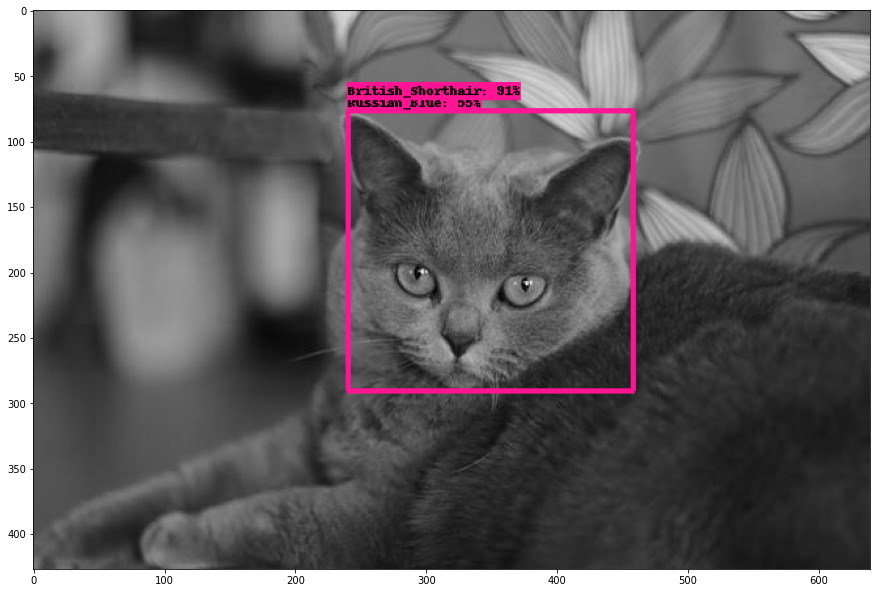

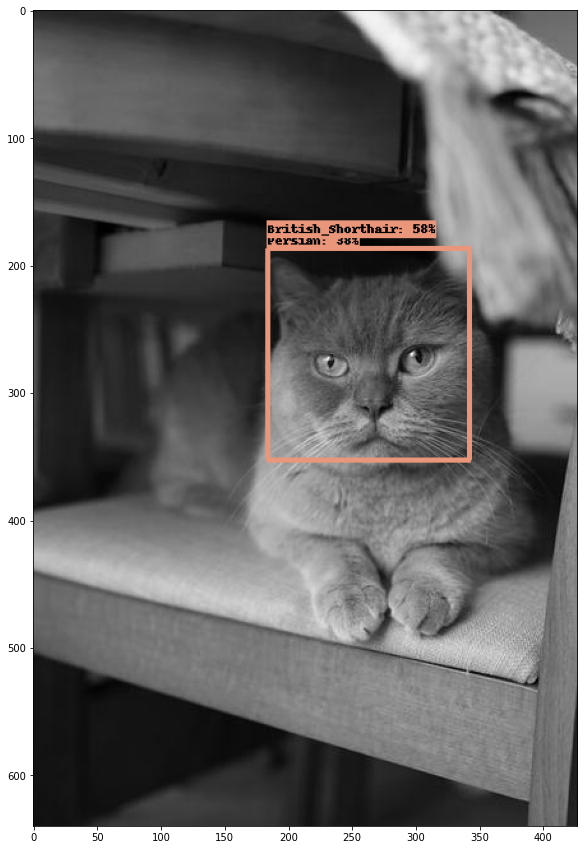

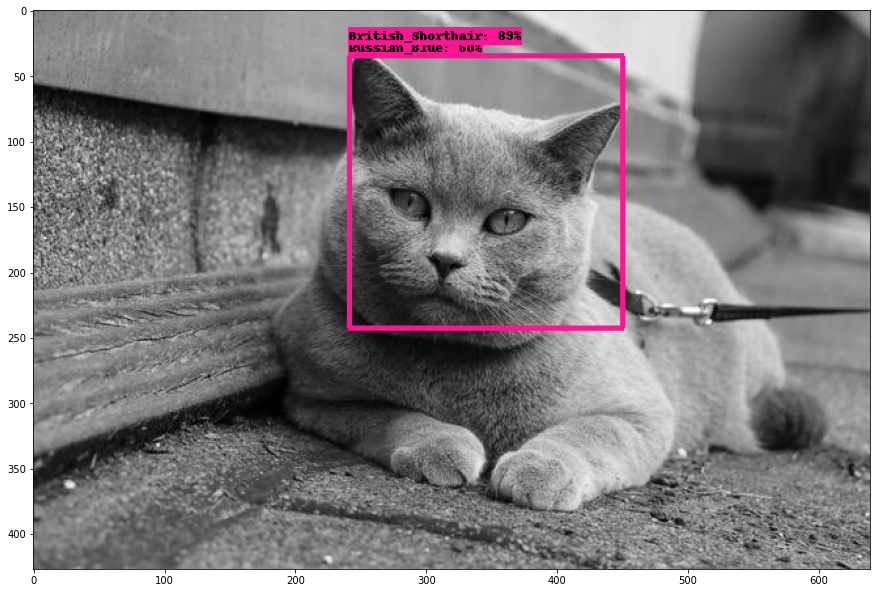

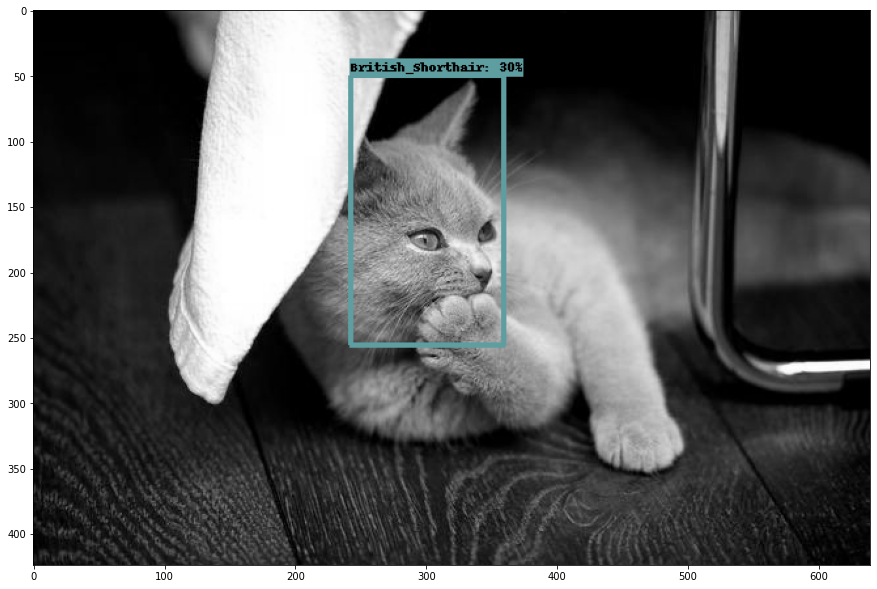

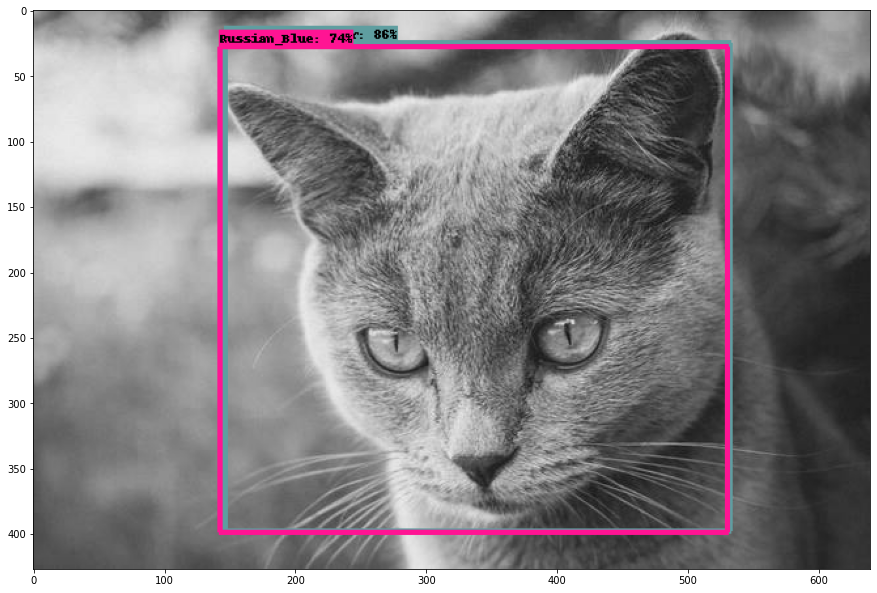

In [ ]:
for image_path in testimage:

    print('Running inference for {}... '.format(image_path), end='')

    image_np = load_image_into_numpy_array(image_path)

    # Things to try:
    # Flip horizontally
    image_np = np.fliplr(image_np).copy()

    # Convert image to grayscale
    image_np = np.tile(
        np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=200,
          min_score_thresh=.30,
          agnostic_mode=False)

    plt.figure(figsize=(15,15))
    plt.imshow(image_np_with_detections)
    print('Done')
plt.show()